# Clustering and dimeonsionality reduction techniques combined

In this notebook, we show how the clustering performance changes when dimensionality reduction techniques like Principal component analysis (PCA), Independent component analysis (ICA), or Random projections (RP) is combined with algorithms like $k$-means.

* [k-means clustering algorithm (wikipedia)](https://en.wikipedia.org/wiki/K-means_clustering)
* [principal component analysis (wikipedia)](https://en.wikipedia.org/wiki/Principal_component_analysis)
* [independent component analysis (wikipedia)](https://en.wikipedia.org/wiki/Independent_component_analysis)

In [14]:
from itertools import combinations

In [2]:
from matplotlib import pyplot as plt

In [3]:
import numpy as np

In [4]:
import pandas as pd

In [5]:
import seaborn as sns

In [82]:
from sklearn.cluster import KMeans
from sklearn.datasets import make_blobs
from sklearn.datasets import make_classification
from sklearn.decomposition import FastICA
from sklearn.decomposition import PCA
from sklearn.metrics import adjusted_rand_score
from sklearn.metrics import completeness_score
from sklearn.metrics import silhouette_score
from sklearn.metrics import v_measure_score
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import MinMaxScaler
from sklearn.random_projection import GaussianRandomProjection

In [6]:
n_features = 8
n_cluster = 5
cluster_std = 1.5
n_samples = 1000

In [10]:
data1 = make_blobs(n_samples=n_samples,n_features=n_features,centers=n_cluster,cluster_std=cluster_std)

In [12]:
d1 = data1[0]

In [13]:
df1=pd.DataFrame(data=d1,columns=['Feature_'+str(i) for i in range(1,n_features+1)])
df1.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,-4.108365,-2.943119,-8.595535,11.474955,7.820538,-4.607714,1.911816,0.527778
1,-7.114702,6.464373,-3.967506,-0.476814,4.803379,8.883485,-1.278824,2.572960
2,-4.251164,-0.076050,-9.768931,9.255303,8.666726,-4.059356,0.511281,-1.222333
3,-10.526319,7.094318,-4.540238,-6.647349,9.310989,10.735743,-5.120726,2.522309
4,9.172373,-2.052786,-3.285971,1.281435,-5.282413,4.341269,-2.537905,-2.587161


In [15]:
lst_vars=list(combinations(df1.columns,2))

In [16]:
len(lst_vars)

28

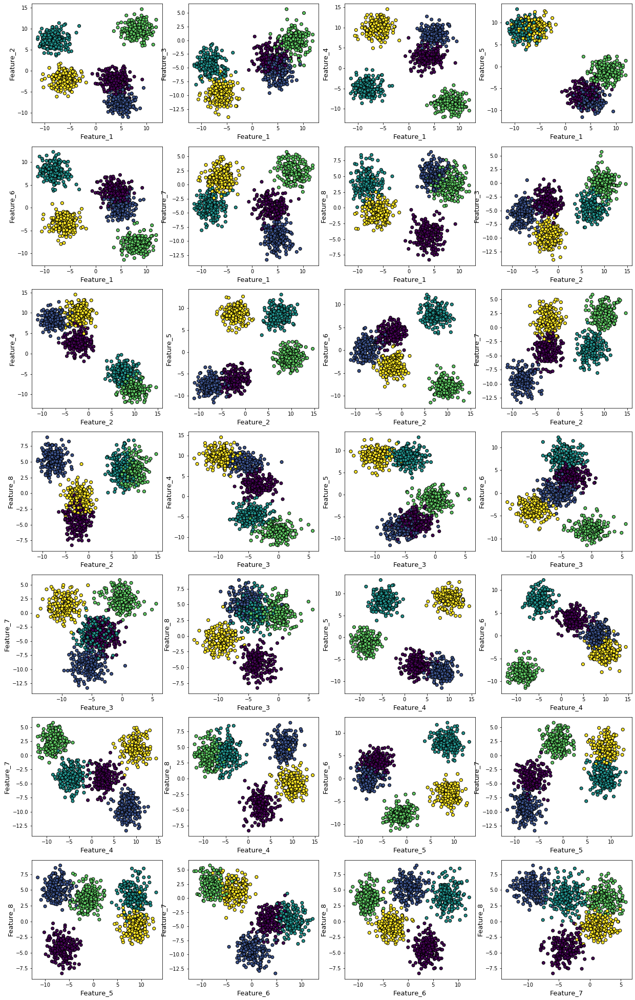

In [17]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=data1[1],edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

In [18]:
df1.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Feature_1,1000.0,0.524122,6.619019,-11.391917,-6.567716,3.300399,5.862981,11.913733
Feature_2,1000.0,1.053124,6.616453,-11.006323,-3.924142,-1.105261,7.838720,14.668746
Feature_3,1000.0,-4.635905,3.438725,-13.993074,-6.792350,-4.494032,-2.382173,5.678629
Feature_4,1000.0,1.512019,7.302213,-12.034780,-5.630599,2.685883,8.451832,14.490233
Feature_5,1000.0,0.415283,7.208000,-11.565601,-6.542186,-1.172978,8.222575,13.081795
Feature_6,1000.0,0.060643,5.679535,-11.461827,-4.591763,0.233097,4.586259,12.220033
Feature_7,1000.0,-2.696946,4.480616,-13.340088,-5.575458,-2.974909,1.296324,5.814242
Feature_8,1000.0,1.580748,3.853782,-8.285609,-1.486776,2.801866,4.569262,8.894125


### How are the classes separated (boxplots)

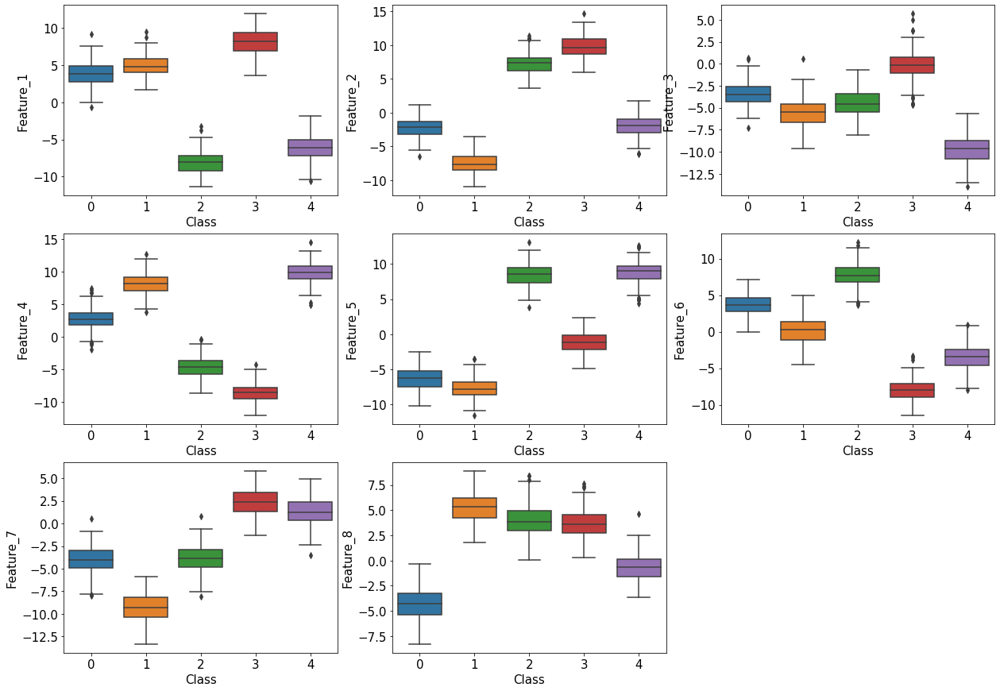

In [19]:
plt.figure(figsize=(21,15))
for i,c in enumerate(df1.columns):
    plt.subplot(3,3,i+1)
    sns.boxplot(y=df1[c],x=data1[1])
    plt.xticks(fontsize=15)
    plt.yticks(fontsize=15)
    plt.xlabel("Class",fontsize=15)
    plt.ylabel(c,fontsize=15)
    #plt.show()

## $k$-means clustering

### Unlabled data

In [21]:
X=df1

In [22]:
X.head()

,Feature_1,Feature_2,Feature_3,Feature_4,Feature_5,Feature_6,Feature_7,Feature_8
0,-4.108365,-2.943119,-8.595535,11.474955,7.820538,-4.607714,1.911816,0.527778
1,-7.114702,6.464373,-3.967506,-0.476814,4.803379,8.883485,-1.278824,2.572960
2,-4.251164,-0.076050,-9.768931,9.255303,8.666726,-4.059356,0.511281,-1.222333
3,-10.526319,7.094318,-4.540238,-6.647349,9.310989,10.735743,-5.120726,2.522309
4,9.172373,-2.052786,-3.285971,1.281435,-5.282413,4.341269,-2.537905,-2.587161


In [23]:
y=data1[1]

## Scaling

In [25]:
scaler = MinMaxScaler()

In [26]:
X_scaled=scaler.fit_transform(X)

## Metrics

### Running $k$-means and computing inter-cluster distance score for various $k$ values

In [28]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_scaled)
    preds = km.predict(X_scaled)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_scaled)))
    km_scores.append(-km.score(X_scaled))
    silhouette = silhouette_score(X_scaled,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -332.24703340314517
Silhouette score for number of cluster(s) 2: 0.38033954252755586
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -176.4928094449108
Silhouette score for number of cluster(s) 3: 0.5424307353240229
V-measure score for number of cluster(s) 3: 0.7918756684685214
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -88.71575277673807
Silhouette score for number of cluster(s) 4: 0.6491228147463645
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -37.531682331163566
Silhouette score for number of cluster(s) 5: 0.6984163198309186
V-measure score for number of cluster(

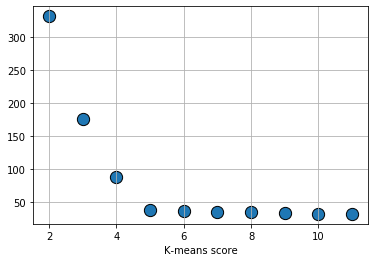

In [30]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("K-means score")
plt.show()

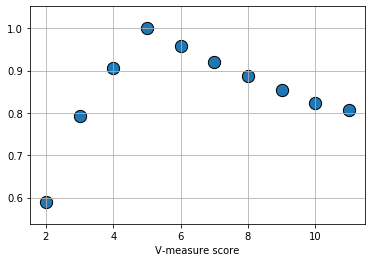

In [31]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("V-measure score")
plt.show()

In [32]:
km = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_scaled)

In [33]:
preds_km = km.predict(X_scaled)

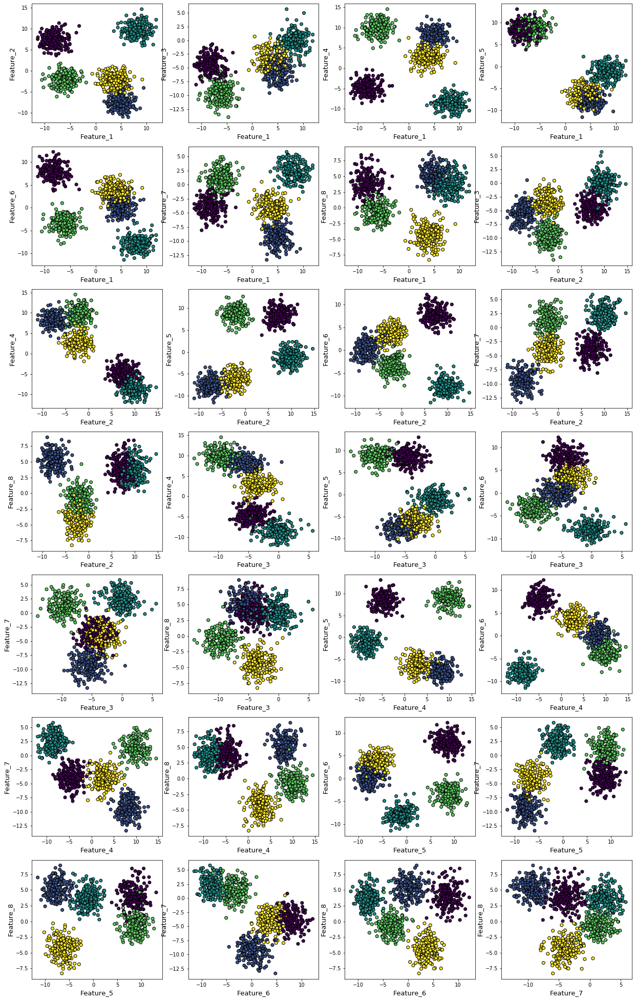

In [34]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_km,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Expectation-maximization (Gaussian Mixture Model)

In [36]:
gm_bic= []
gm_score=[]
for i in range(2,12):
    gm = GaussianMixture(n_components=i,n_init=10,tol=1e-3,max_iter=1000).fit(X_scaled)
    print("BIC for number of cluster(s) {}: {}".format(i,gm.bic(X_scaled)))
    print("Log-likelihood score for number of cluster(s) {}: {}".format(i,gm.score(X_scaled)))
    print("-"*100)
    gm_bic.append(-gm.bic(X_scaled))
    gm_score.append(gm.score(X_scaled))

BIC for number of cluster(s) 2: -12839.59856522124
Log-likelihood score for number of cluster(s) 2: 6.727194392525325
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 3: -14661.980294950055
Log-likelihood score for number of cluster(s) 3: 7.793809751166831
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 4: -15458.691160239905
Log-likelihood score for number of cluster(s) 4: 8.347589677588854
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 5: -15927.809246239216
Log-likelihood score for number of cluster(s) 5: 8.737573214365607
----------------------------------------------------------------------------------------------------
BIC for number of cluster(s) 6: -15686.319010723479
Log-likelihood score for number of cluster(s) 6: 8.772252590384836
--

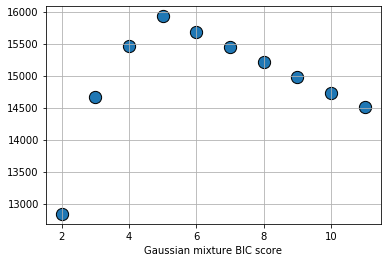

In [37]:
plt.scatter(x=[i for i in range(2,12)],y=gm_bic,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("Gaussian mixture BIC score")
plt.show()

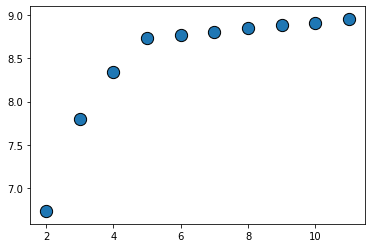

In [38]:
plt.scatter(x=[i for i in range(2,12)],y=gm_score,s=150,edgecolor='k')
plt.show()

In [39]:
gm = GaussianMixture(n_components=5,verbose=1,n_init=10,tol=1e-2,covariance_type='full',max_iter=1000).fit(X_scaled)

Initialization 0
Initialization converged: True
Initialization 1
Initialization converged: True
Initialization 2
Initialization converged: True
Initialization 3
Initialization converged: True
Initialization 4
Initialization converged: True
Initialization 5
Initialization converged: True
Initialization 6
Initialization converged: True
Initialization 7
Initialization converged: True
Initialization 8
Initialization converged: True
Initialization 9
Initialization converged: True


In [40]:
gm.means_

array([[0.14142622, 0.71226557, 0.48499012, 0.27804377, 0.81157652,
        0.81386888, 0.49744353, 0.71399043],
       [0.65279978, 0.34115924, 0.53865782, 0.55778323, 0.21261006,
        0.63931676, 0.48714979, 0.23086178],
       [0.22418513, 0.35062333, 0.22051131, 0.82400641, 0.82690891,
        0.33811027, 0.7644376 , 0.44151106],
       [0.83738602, 0.80789782, 0.70469969, 0.13120234, 0.42188213,
        0.14803918, 0.82119979, 0.69608156],
       [0.70067292, 0.13652819, 0.4294732 , 0.76255378, 0.15747874,
        0.49342781, 0.20802946, 0.78906563]])

In [41]:
km.cluster_centers_

array([[0.14142622, 0.71226557, 0.48499012, 0.27804377, 0.81157652,
        0.81386888, 0.49744353, 0.71399043],
       [0.70067292, 0.13652819, 0.4294732 , 0.76255378, 0.15747874,
        0.49342781, 0.20802946, 0.78906563],
       [0.83738602, 0.80789782, 0.70469969, 0.13120234, 0.42188213,
        0.14803918, 0.82119979, 0.69608156],
       [0.22418513, 0.35062333, 0.22051131, 0.82400641, 0.82690891,
        0.33811027, 0.7644376 , 0.44151106],
       [0.65279978, 0.34115924, 0.53865782, 0.55778323, 0.21261006,
        0.63931676, 0.48714979, 0.23086178]])

In [42]:
gm.means_/km.cluster_centers_

array([[1.        , 1.        , 1.        , 1.        , 1.        ,
        1.        , 1.        , 1.        ],
       [0.93167548, 2.49881895, 1.25422918, 0.7314674 , 1.3500874 ,
        1.29566421, 2.34173459, 0.29257614],
       [0.26772017, 0.43399465, 0.3129153 , 6.28042483, 1.96004724,
        2.28392422, 0.93087896, 0.63428065],
       [3.73524336, 2.30417587, 3.19575302, 0.1592249 , 0.51019179,
        0.4378429 , 1.07425352, 1.57658917],
       [1.07333511, 0.40018906, 0.79730245, 1.36711492, 0.74069279,
        0.77180491, 0.42703388, 3.4179137 ]])

In [43]:
preds_gm=gm.predict(X_scaled)

In [44]:
km_rand_score = adjusted_rand_score(preds_km,y)

In [45]:
gm_rand_score = adjusted_rand_score(preds_gm,y)

In [46]:
print("Adjusted Rand score for k-means",km_rand_score)
print("Adjusted Rand score for Gaussian Mixture model",gm_rand_score)

Adjusted Rand score for k-means 1.0
Adjusted Rand score for Gaussian Mixture model 1.0


In [47]:
silhouette_score(X_scaled,preds_km)

0.6984163198309186

In [48]:
silhouette_score(X_scaled,preds_gm)

0.6984163198309186

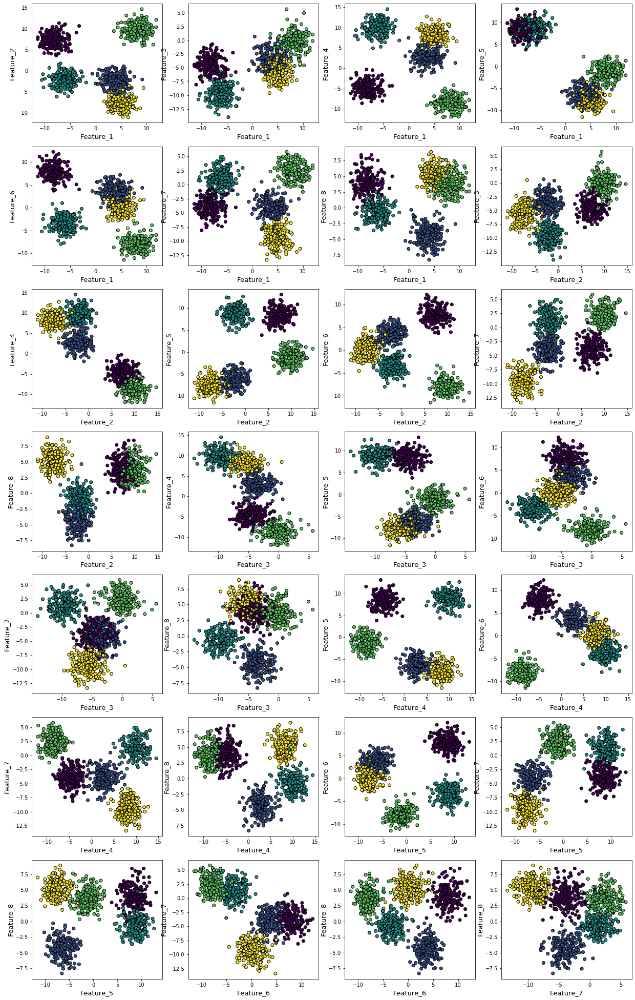

In [49]:
plt.figure(figsize=(21,35))
for i in range(1,29):
    plt.subplot(7,4,i)
    dim1=lst_vars[i-1][0]
    dim2=lst_vars[i-1][1]
    plt.scatter(df1[dim1],df1[dim2],c=preds_gm,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Principal Component Analyis (PCA)

In [51]:
n_prin_comp = 3

In [52]:
pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
pca_partial.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=3, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

In [53]:
pca_full = PCA(n_components=n_features,svd_solver='full')
pca_full.fit(X_scaled)

PCA(copy=True, iterated_power='auto', n_components=8, random_state=None,
    svd_solver='full', tol=0.0, whiten=False)

### How much variance is explained by principal components?

With the help of this plot, we can decide to work with only the first 3 principal components

In [54]:
pca_explained_var = pca_full.explained_variance_ratio_

In [55]:
cum_explaiend_var = pca_explained_var.cumsum()

In [56]:
cum_explaiend_var

array([0.36570297, 0.70120189, 0.86425931, 0.96388533, 0.97528645,
       0.98555025, 0.99361869, 1.        ])

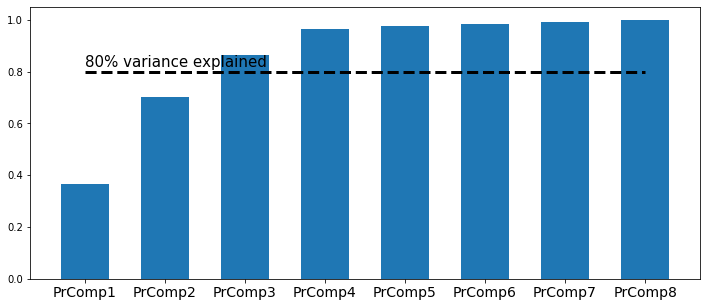

In [58]:
plt.figure(figsize=(12,5))
plt.bar(x=['PrComp'+str(i) for i in range(1,9)],
        height=cum_explaiend_var,
        width=0.6)
plt.xticks(fontsize=14)
plt.hlines(y=0.8,
           xmin='PrComp1',
           xmax='PrComp8',
           linestyles='dashed',
           lw=3)
plt.text(x='PrComp1',
         y=0.82,
         s="80% variance explained",
         fontsize=15)
plt.show()

### Transform the original variables in principal component space and create a DataFrame

In [59]:
X_pca = pca_partial.fit_transform(X_scaled)

In [61]:
df_pca=pd.DataFrame(data=X_pca,
                    columns=['Principal_comp'+str(i) for i in range(1,n_prin_comp+1)])

### Running $k$-means on the transformed features

In [62]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_pca)))
    km_scores.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -264.81817629954196
Silhouette score for number of cluster(s) 2: 0.4651530893988692
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -111.42297104174894
Silhouette score for number of cluster(s) 3: 0.6594808344574593
V-measure score for number of cluster(s) 3: 0.7918756684685214
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -23.87111714461023
Silhouette score for number of cluster(s) 4: 0.8029514527093274
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -13.281712634795575
Silhouette score for number of cluster(s) 5: 0.7273138588921502
V-measure score for number of cluster(

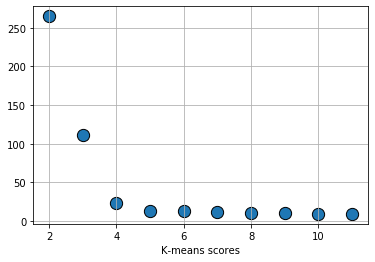

In [63]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("K-means scores")
plt.show()

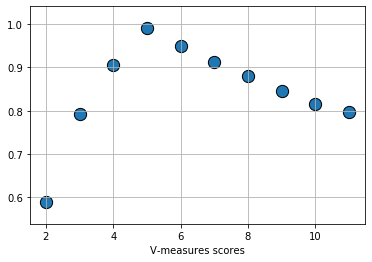

In [64]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score,s=150,edgecolor='k')
plt.grid(True)
plt.xlabel("V-measures scores")
plt.show()

### $k$-means fitting with PCA-transformed data

In [65]:
km_pca = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_pca)
preds_km_pca = km_pca.predict(X_pca)

### Visualizing the clusters after running $k$-means on PCA-transformed features

In [66]:
col_pca_combi=list(combinations(df_pca.columns,2))
num_pca_combi = len(col_pca_combi)

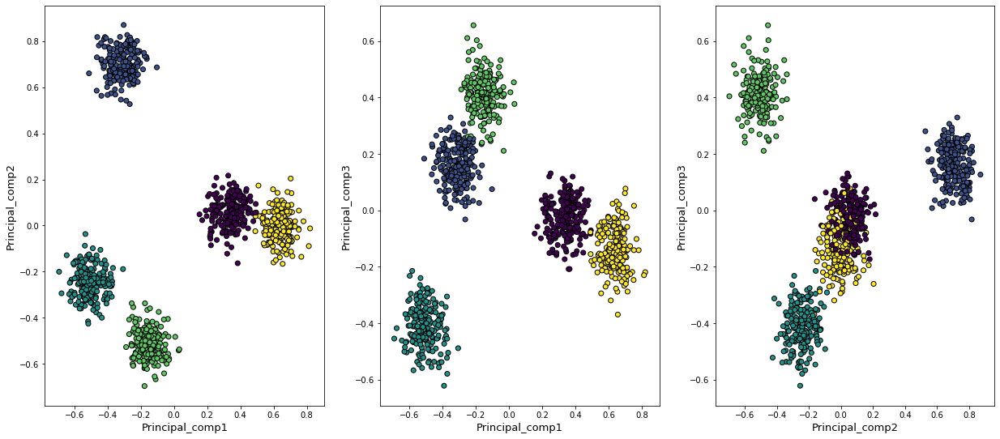

In [67]:
plt.figure(figsize=(21,20))
for i in range(1,num_pca_combi+1):
    plt.subplot(int(num_pca_combi/3)+1,3,i)
    dim1=col_pca_combi[i-1][0]
    dim2=col_pca_combi[i-1][1]
    plt.scatter(df_pca[dim1],df_pca[dim2],c=preds_km_pca,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## ICA (Independent Component Analysis)

In [70]:
n_ind_comp = 3

In [71]:
ica_partial = FastICA(n_components=n_ind_comp)
ica_partial.fit(X_scaled)

FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=200,
        n_components=3, random_state=None, tol=0.0001, w_init=None,
        whiten=True)

In [72]:
ica_full = FastICA(max_iter=1000)
ica_full.fit(X_scaled)

/Users/florian/anaconda3/envs/nf/lib/python3.6/site-packages/sklearn/decomposition/fastica_.py:119: ConvergenceWarning: FastICA did not converge. Consider increasing tolerance or the maximum number of iterations.
  ConvergenceWarning)


FastICA(algorithm='parallel', fun='logcosh', fun_args=None, max_iter=1000,
        n_components=None, random_state=None, tol=0.0001, w_init=None,
        whiten=True)

In [73]:
X_ica = ica_partial.fit_transform(X_scaled)

In [75]:
df_ica=pd.DataFrame(data=X_ica,
                    columns=['Independent_comp'+str(i) for i in range(1,n_ind_comp+1)])

### Running $k$-means on the independent features

In [76]:
km_scores= []
km_silhouette = []
vmeasure_score =[]
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_ica)
    preds = km.predict(X_ica)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_ica)))
    km_scores.append(-km.score(X_ica))
    silhouette = silhouette_score(X_ica,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -2.0351459010719486
Silhouette score for number of cluster(s) 2: 0.4319547017696806
V-measure score for number of cluster(s) 2: 0.589727521756156
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -1.0990425736515927
Silhouette score for number of cluster(s) 3: 0.6032842927620223
V-measure score for number of cluster(s) 3: 0.7424834172925042
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -0.17514156996942593
Silhouette score for number of cluster(s) 4: 0.797549299023372
V-measure score for number of cluster(s) 4: 0.9057460992755191
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -0.10880238996131601
Silhouette score for number of cluster(s) 5: 0.7018875483461977
V-measure score for number of cluste

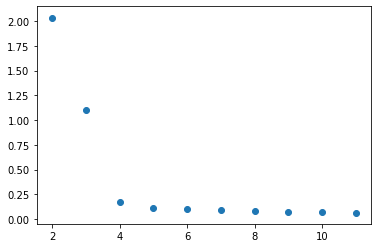

In [77]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores)
plt.show()

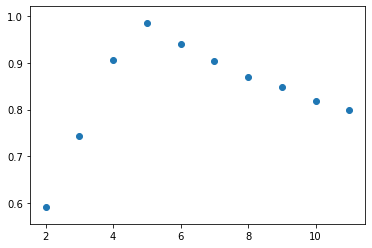

In [78]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score)
plt.show()

### $k$-means fitting with ICA-transformed data

In [79]:
km_ica = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_ica)
preds_km_ica = km_ica.predict(X_ica)

### Visualizing the clusters after running $k$-means on ICA-transformed features

In [80]:
col_ica_combi=list(combinations(df_ica.columns,2))
num_ica_combi = len(col_ica_combi)

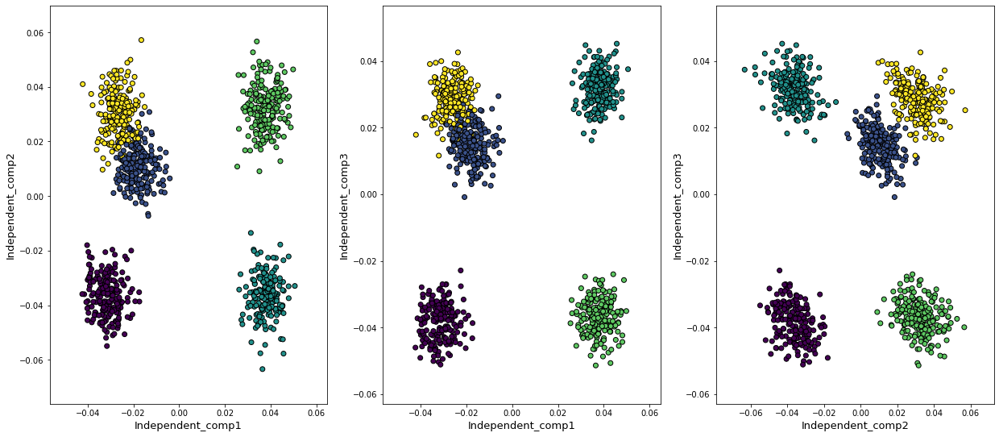

In [81]:
plt.figure(figsize=(21,20))
for i in range(1,num_ica_combi+1):
    plt.subplot(int(num_ica_combi/3)+1,3,i)
    dim1=col_ica_combi[i-1][0]
    dim2=col_ica_combi[i-1][1]
    plt.scatter(df_ica[dim1],df_ica[dim2],c=preds_km_ica,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)

## Random Projection

In [83]:
n_random_comp = 3

In [84]:
random_proj = GaussianRandomProjection(n_components=n_random_comp)

In [85]:
X_random_proj = random_proj.fit_transform(X_scaled)

In [86]:
df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])

### Running $k$-means on random projections

In [87]:
km_scores= []
km_silhouette = []
vmeasure_score = []
for i in range(2,12):
    km = KMeans(n_clusters=i, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for number of cluster(s) {}: {}".format(i,km.score(X_random_proj)))
    km_scores.append(-km.score(X_random_proj))
    silhouette = silhouette_score(X_random_proj,preds)
    km_silhouette.append(silhouette)
    print("Silhouette score for number of cluster(s) {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    vmeasure_score.append(v_measure)
    print("V-measure score for number of cluster(s) {}: {}".format(i,v_measure))
    print("-"*100)

Score for number of cluster(s) 2: -102.64270468274715
Silhouette score for number of cluster(s) 2: 0.45615658296863454
V-measure score for number of cluster(s) 2: 0.5545761471816193
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 3: -66.07027690100875
Silhouette score for number of cluster(s) 3: 0.48522496300252316
V-measure score for number of cluster(s) 3: 0.7552171762715874
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 4: -41.012364397298114
Silhouette score for number of cluster(s) 4: 0.5238813075142582
V-measure score for number of cluster(s) 4: 0.8667440676226286
----------------------------------------------------------------------------------------------------
Score for number of cluster(s) 5: -23.825018202289655
Silhouette score for number of cluster(s) 5: 0.5733646155877304
V-measure score for number of clust

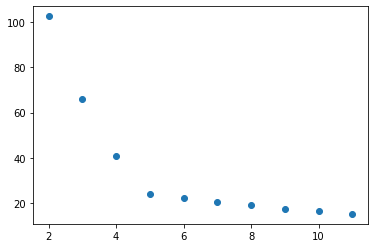

In [88]:
plt.scatter(x=[i for i in range(2,12)],y=km_scores)
plt.show()

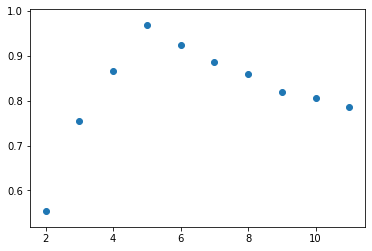

In [89]:
plt.scatter(x=[i for i in range(2,12)],y=vmeasure_score)
plt.show()

### $k$-means fitting with random-projected data

In [90]:
km_random_proj = KMeans(n_clusters=5,n_init=10,max_iter=500).fit(X=X_random_proj)
preds_km_random_proj = km_random_proj.predict(X_random_proj)

### Visualizing the clusters after running $k$-means on random-projected features

In [91]:
col_random_proj_combi=list(combinations(df_random_proj.columns,2))
num_random_proj_combi = len(col_random_proj_combi)

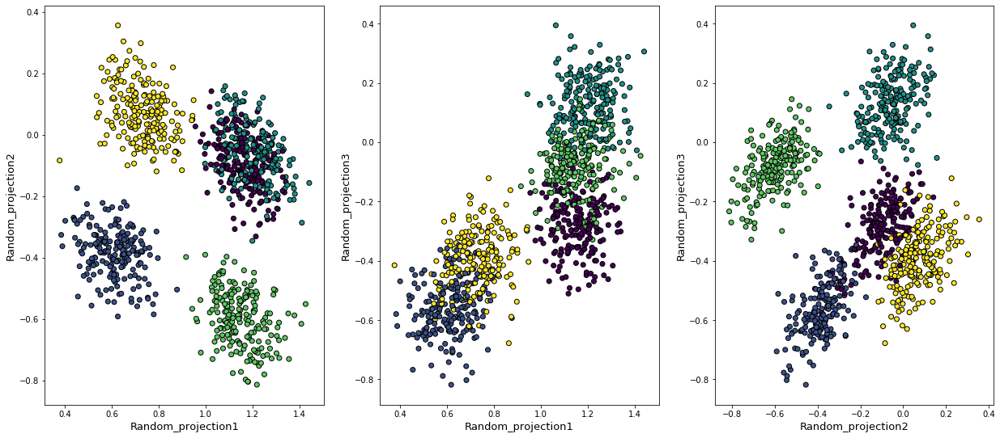

In [92]:
plt.figure(figsize=(21,20))
for i in range(1,num_random_proj_combi+1):
    plt.subplot(int(num_random_proj_combi/3)+1,3,i)
    dim1=col_random_proj_combi[i-1][0]
    dim2=col_random_proj_combi[i-1][1]
    plt.scatter(df_random_proj[dim1],df_random_proj[dim2],c=preds_km_random_proj,edgecolor='k')
    plt.xlabel(f"{dim1}",fontsize=13)
    plt.ylabel(f"{dim2}",fontsize=13)
plt.show()

In [93]:
def plot_cluster_rp(df_rp,preds_rp):
    """
    Plots clusters after running random projection
    """
    plt.figure(figsize=(21,12))
    for i in range(1,num_random_proj_combi+1):
        plt.subplot(int(num_random_proj_combi/3)+1,3,i)
        dim1=col_random_proj_combi[i-1][0]
        dim2=col_random_proj_combi[i-1][1]
        plt.scatter(df_rp[dim1],df_rp[dim2],c=preds_rp,edgecolor='k')
        plt.xlabel(f"{dim1}",fontsize=13)
        plt.ylabel(f"{dim2}",fontsize=13)
    plt.show()

### Running the random projections many times

Score for iteration 0: -37.72908378315846
Silhouette score for iteration 0: 0.6281513019848419
V-measure score for iteration 0: 0.9526487883088482
----------------------------------------------------------------------------------------------------


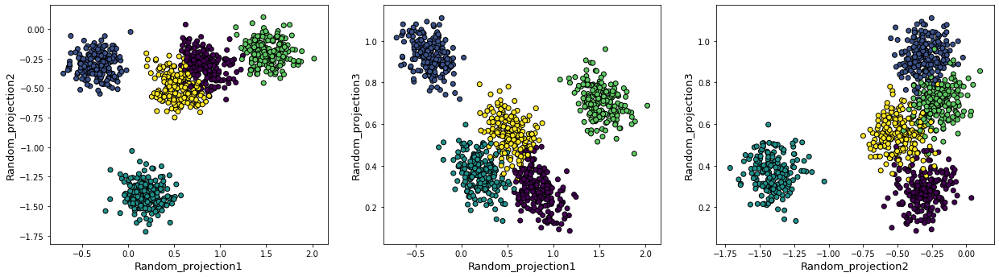

Score for iteration 1: -22.65150038748785
Silhouette score for iteration 1: 0.6879023793354693
V-measure score for iteration 1: 1.0
----------------------------------------------------------------------------------------------------


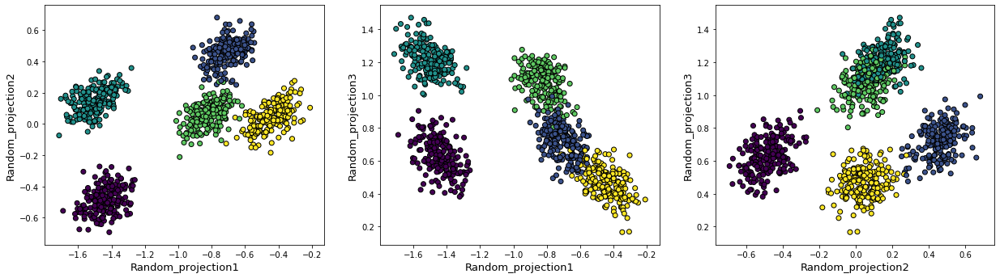

Score for iteration 2: -30.92967701818292
Silhouette score for iteration 2: 0.5376409942689718
V-measure score for iteration 2: 0.9104156970083102
----------------------------------------------------------------------------------------------------


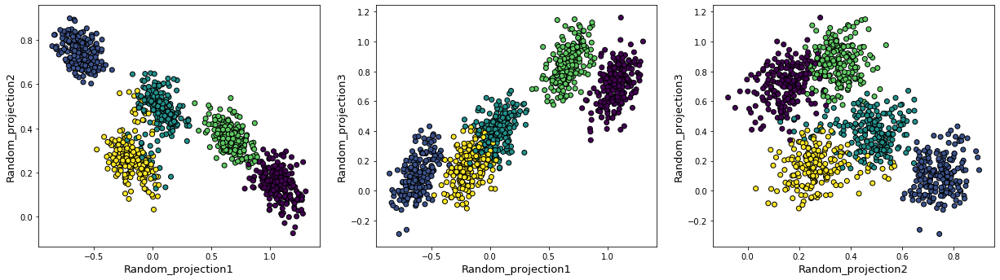

Score for iteration 3: -29.054716418849605
Silhouette score for iteration 3: 0.4459435305416563
V-measure score for iteration 3: 0.8096676169147242
----------------------------------------------------------------------------------------------------


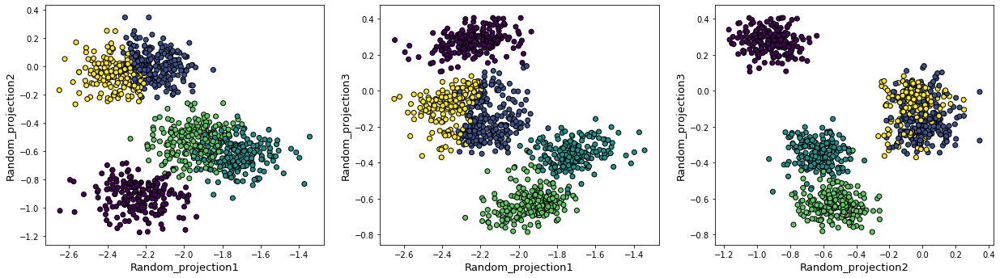

Score for iteration 4: -29.722457207128468
Silhouette score for iteration 4: 0.4746090487971745
V-measure score for iteration 4: 0.8841096881870119
----------------------------------------------------------------------------------------------------


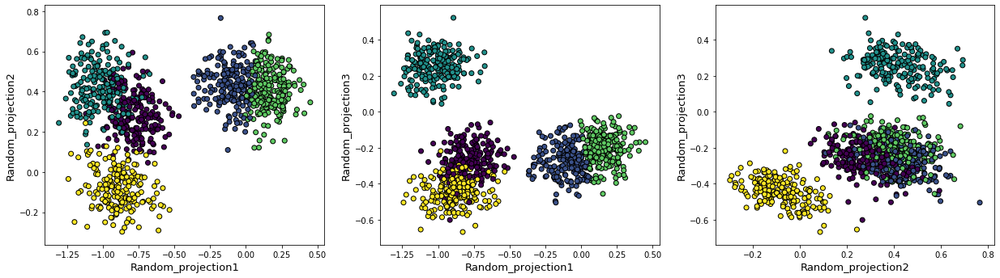

Score for iteration 5: -42.57141628996385
Silhouette score for iteration 5: 0.5522397091249488
V-measure score for iteration 5: 0.9713051175248775
----------------------------------------------------------------------------------------------------


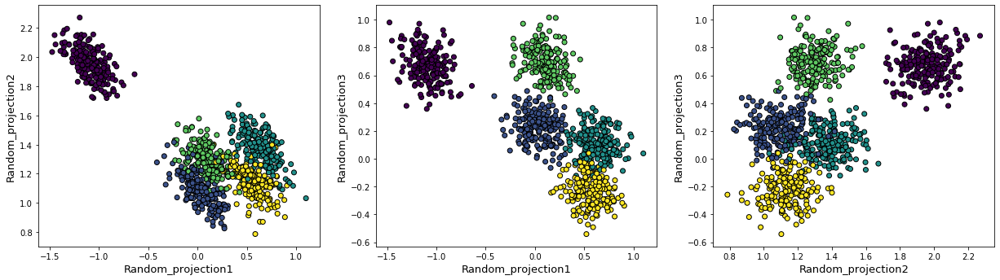

Score for iteration 6: -23.862865138764715
Silhouette score for iteration 6: 0.5244220198078776
V-measure score for iteration 6: 0.9048492749246505
----------------------------------------------------------------------------------------------------


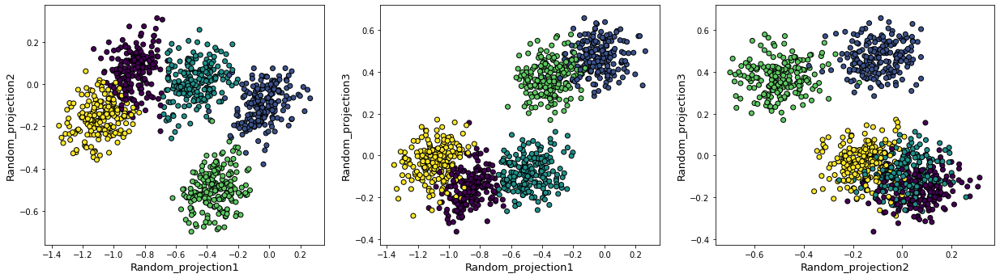

Score for iteration 7: -46.57797880968621
Silhouette score for iteration 7: 0.617206556691041
V-measure score for iteration 7: 0.9037993953723595
----------------------------------------------------------------------------------------------------


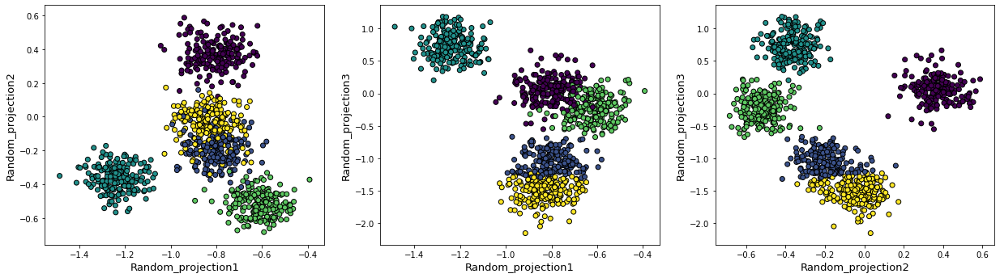

Score for iteration 8: -43.19939433041787
Silhouette score for iteration 8: 0.5772052920941237
V-measure score for iteration 8: 0.9746759914007723
----------------------------------------------------------------------------------------------------


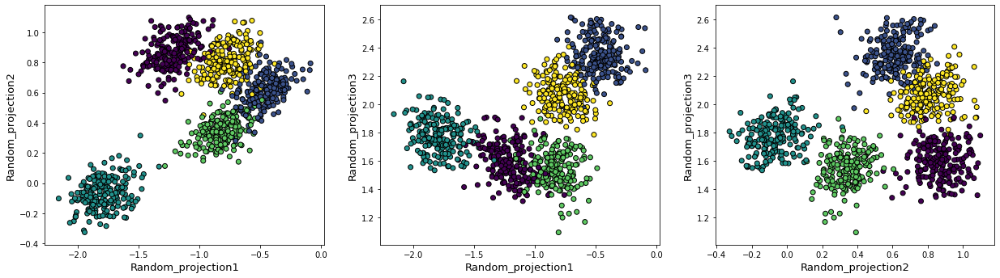

Score for iteration 9: -19.46449582922739
Silhouette score for iteration 9: 0.4321281377285001
V-measure score for iteration 9: 0.7916837697227855
----------------------------------------------------------------------------------------------------


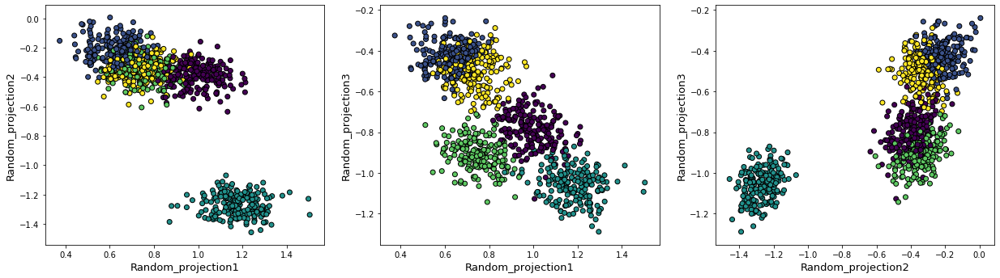

Score for iteration 10: -37.80439682296449
Silhouette score for iteration 10: 0.5382973312400418
V-measure score for iteration 10: 0.9626409357894725
----------------------------------------------------------------------------------------------------


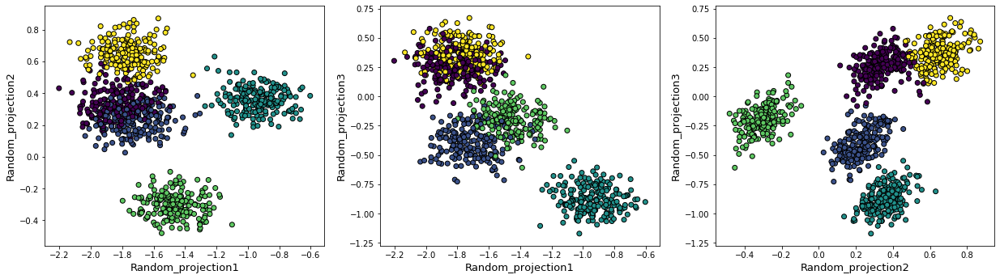

Score for iteration 11: -36.55227849262808
Silhouette score for iteration 11: 0.5450943416398522
V-measure score for iteration 11: 0.8801471188923421
----------------------------------------------------------------------------------------------------


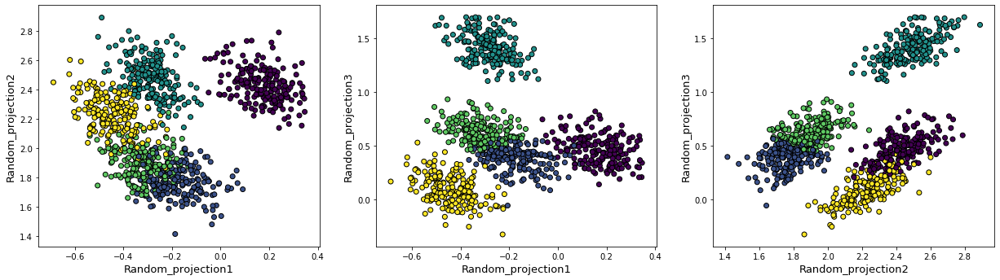

Score for iteration 12: -31.06678377839353
Silhouette score for iteration 12: 0.6388030085594774
V-measure score for iteration 12: 0.9921716939249499
----------------------------------------------------------------------------------------------------


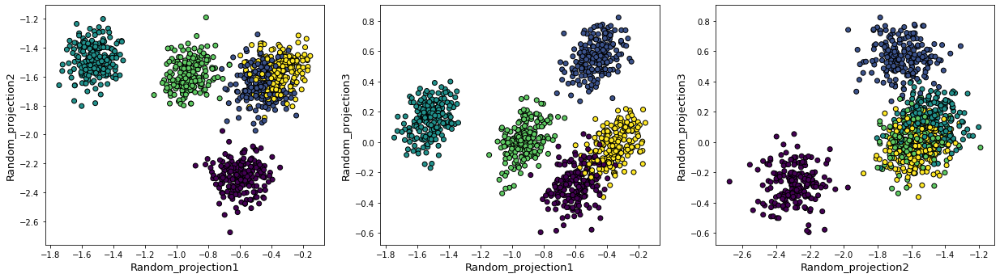

Score for iteration 13: -37.72089741647203
Silhouette score for iteration 13: 0.3936470592215674
V-measure score for iteration 13: 0.7904807595601797
----------------------------------------------------------------------------------------------------


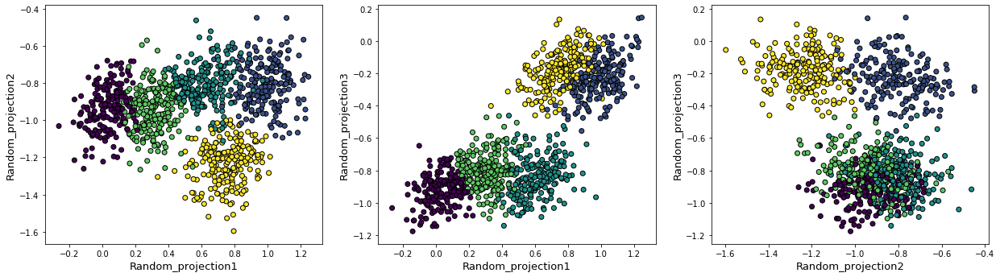

Score for iteration 14: -27.696343490056684
Silhouette score for iteration 14: 0.4796693444294235
V-measure score for iteration 14: 0.8615838969823661
----------------------------------------------------------------------------------------------------


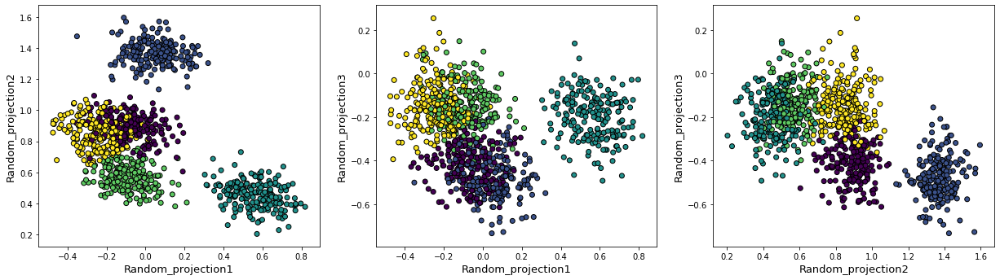

Score for iteration 15: -58.82698373607691
Silhouette score for iteration 15: 0.6135351442199819
V-measure score for iteration 15: 0.9930346013311964
----------------------------------------------------------------------------------------------------


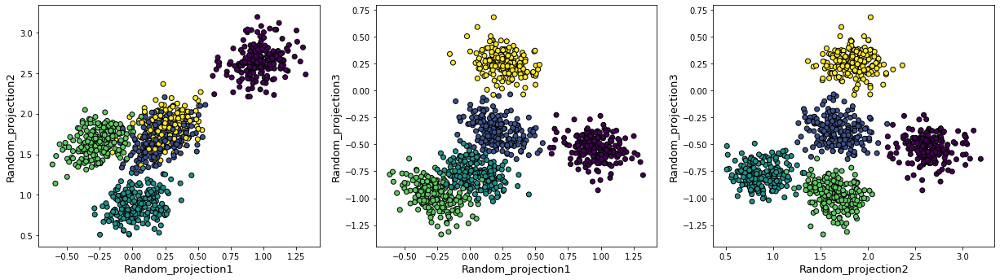

Score for iteration 16: -28.171064046729406
Silhouette score for iteration 16: 0.4772357294120966
V-measure score for iteration 16: 0.7904005089841211
----------------------------------------------------------------------------------------------------


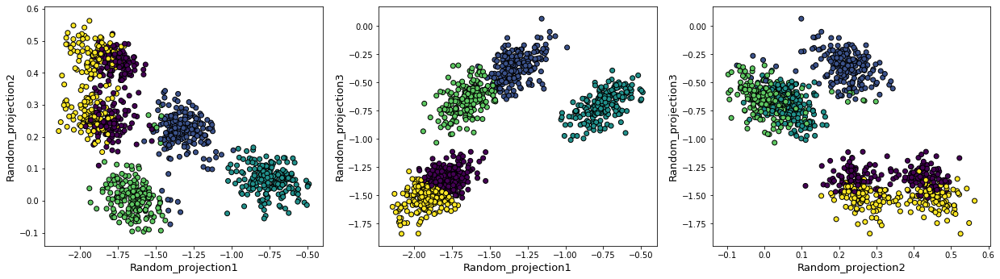

Score for iteration 17: -35.68348316821158
Silhouette score for iteration 17: 0.6334964011595018
V-measure score for iteration 17: 0.9921763826478879
----------------------------------------------------------------------------------------------------


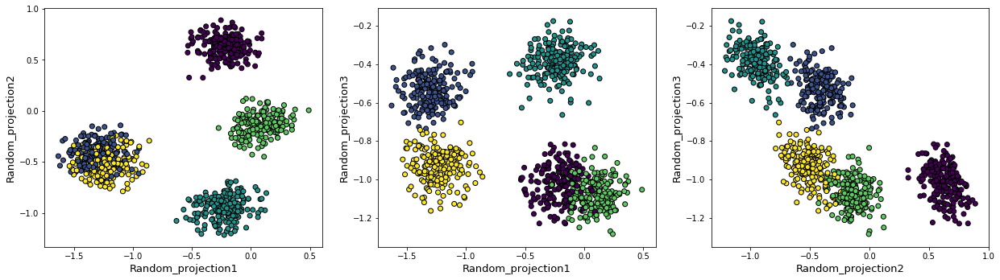

Score for iteration 18: -37.26551081108383
Silhouette score for iteration 18: 0.5303620159314991
V-measure score for iteration 18: 0.9487304413454593
----------------------------------------------------------------------------------------------------


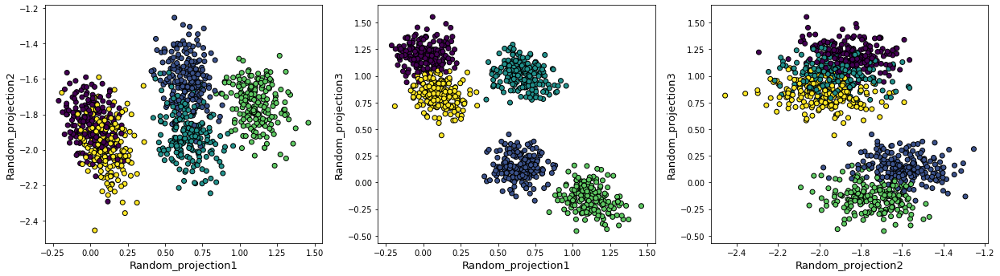

Score for iteration 19: -39.15652561886596
Silhouette score for iteration 19: 0.5573402491421945
V-measure score for iteration 19: 0.928880407288206
----------------------------------------------------------------------------------------------------


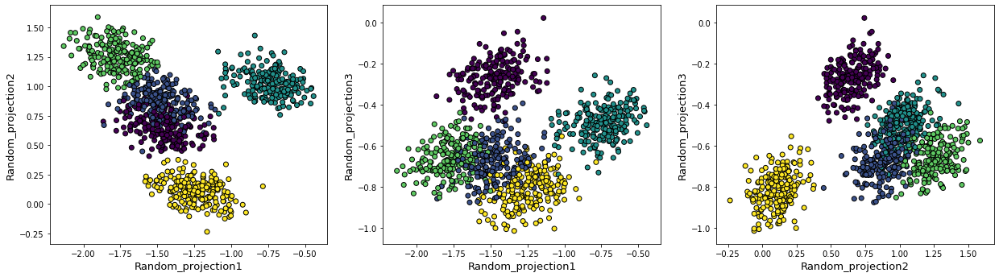

In [94]:
rp_score= []
rp_silhouette = []
rp_vmeasure = []
for i in range(20):
    random_proj = GaussianRandomProjection(n_components=n_random_comp)
    X_random_proj = random_proj.fit_transform(X_scaled)
    df_random_proj=pd.DataFrame(data=X_random_proj,columns=['Random_projection'+str(i) for i in range(1,n_random_comp+1)])
    
    km = KMeans(n_clusters=5, random_state=0).fit(X_random_proj)
    preds = km.predict(X_random_proj)
    print("Score for iteration {}: {}".format(i,km.score(X_random_proj)))
    rp_score.append(-km.score(X_random_proj))
    
    silhouette = silhouette_score(X_random_proj,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)
    
    plot_cluster_rp(df_random_proj,preds)

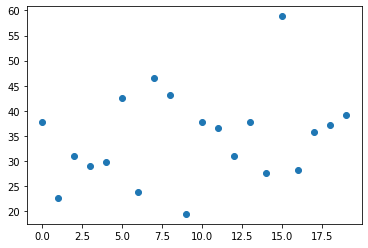

In [95]:
plt.scatter(x=[i for i in range(20)],y=rp_score)
plt.show()

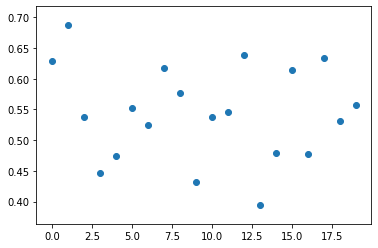

In [96]:
plt.scatter(x=[i for i in range(20)],y=rp_silhouette)
plt.show()

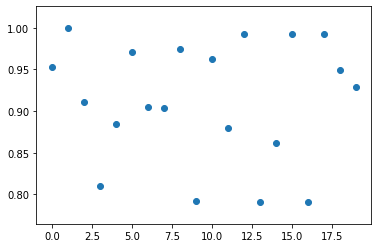

In [97]:
plt.scatter(x=[i for i in range(20)],y=rp_vmeasure)
plt.show()

### This kind of variation does not happen with PCA

In [98]:
pca_score= []
pca_silhouette = []
pca_vmeasure = []
for i in range(20):
    pca_partial = PCA(n_components=n_prin_comp,svd_solver='full')
    X_pca=pca_partial.fit_transform(X_scaled)
    km = KMeans(n_clusters=5, random_state=0).fit(X_pca)
    preds = km.predict(X_pca)
    print("Score for iteration {}: {}".format(i,km.score(X_pca)))
    rp_score.append(-km.score(X_pca))
    silhouette = silhouette_score(X_pca,preds)
    rp_silhouette.append(silhouette)
    print("Silhouette score for iteration {}: {}".format(i,silhouette))
    v_measure = v_measure_score(y,preds)
    rp_vmeasure.append(v_measure)
    print("V-measure score for iteration {}: {}".format(i,v_measure))
    print("-"*100)

Score for iteration 0: -13.281712634795575
Silhouette score for iteration 0: 0.7273138588921502
V-measure score for iteration 0: 0.9903076591576617
----------------------------------------------------------------------------------------------------
Score for iteration 1: -13.281712634795575
Silhouette score for iteration 1: 0.7273138588921502
V-measure score for iteration 1: 0.9903076591576617
----------------------------------------------------------------------------------------------------
Score for iteration 2: -13.281712634795575
Silhouette score for iteration 2: 0.7273138588921502
V-measure score for iteration 2: 0.9903076591576617
----------------------------------------------------------------------------------------------------
Score for iteration 3: -13.281712634795575
Silhouette score for iteration 3: 0.7273138588921502
V-measure score for iteration 3: 0.9903076591576617
----------------------------------------------------------------------------------------------------
Scor